In [1]:
%load_ext autoreload
%autoreload 2

In [42]:
from src import algorithms, types, utils
from plotly import graph_objects as go
import numpy as np
import copy
import collections
from tqdm.notebook import tqdm

## 2D

In [3]:
EPS = 1e-3
ITERS = 50

In [4]:
functions = [
    types.QuadraticFunction(np.array([[1, 2], [2, 5]]), np.array([0, 0]), 0),
    types.QuadraticFunction(np.array([[10, 3], [-2, 1]]), np.array([10, -1]), 5),
    types.QuadraticFunction(np.array([[1, -0.2], [-0.2, 1]]), np.array([-0.2, 0.2]), 0),
]

algos = [
    (
        'constant0.1', 
        algorithms.ConstantGradientDescent('random', alpha=0.1, random_scale=10, epsilon=EPS, use_scale=False)
    ),
    (
        'golden search', 
        algorithms.GoldenSearchGradientDescent('random', 5, EPS, random_scale=10, epsilon=EPS, use_scale=False)
    ),
]

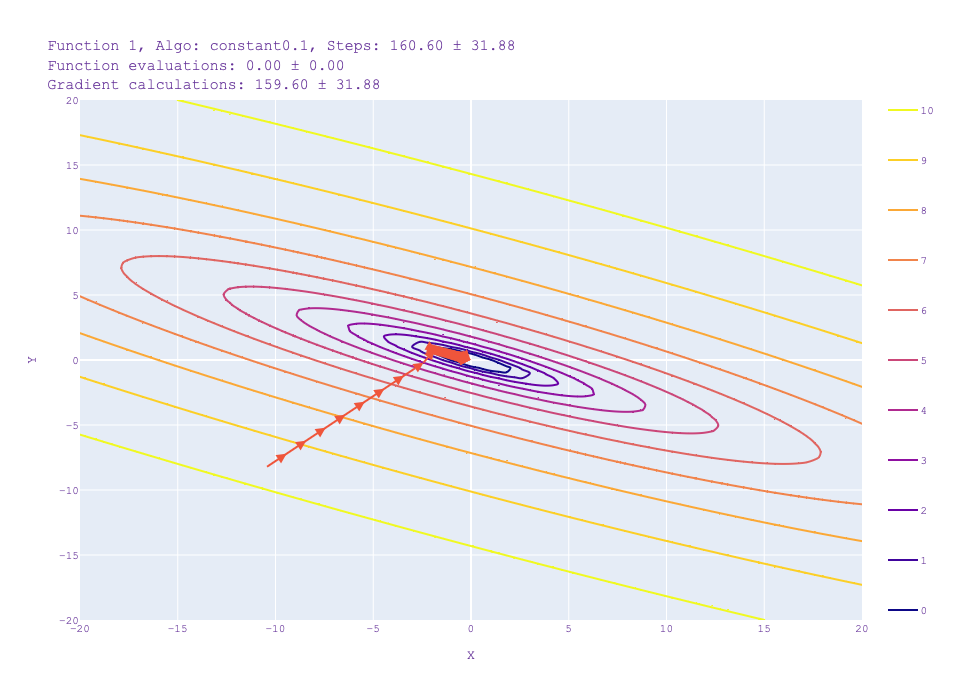

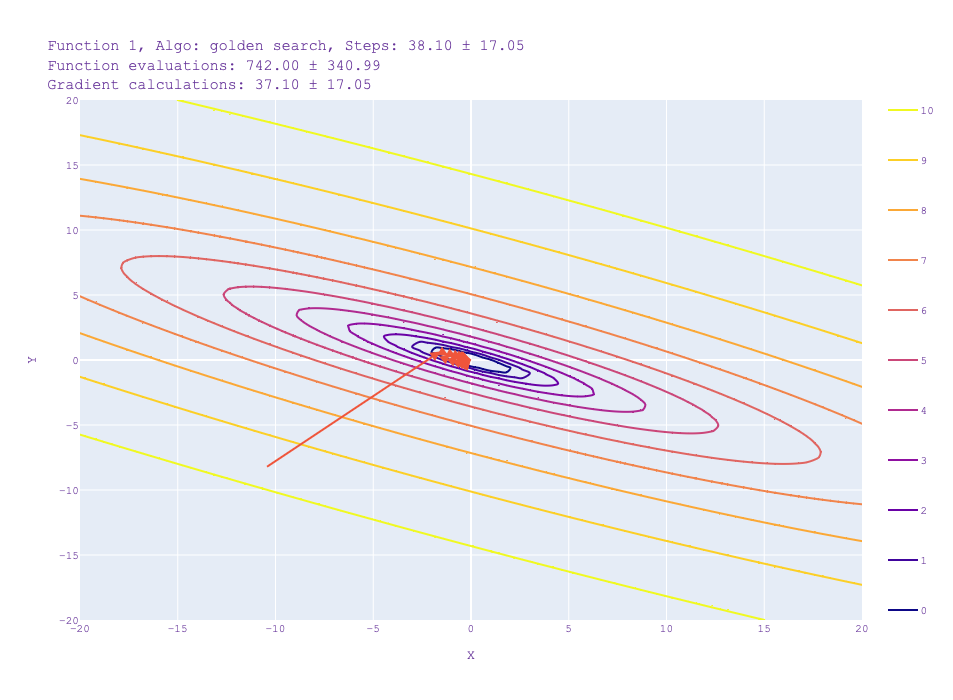

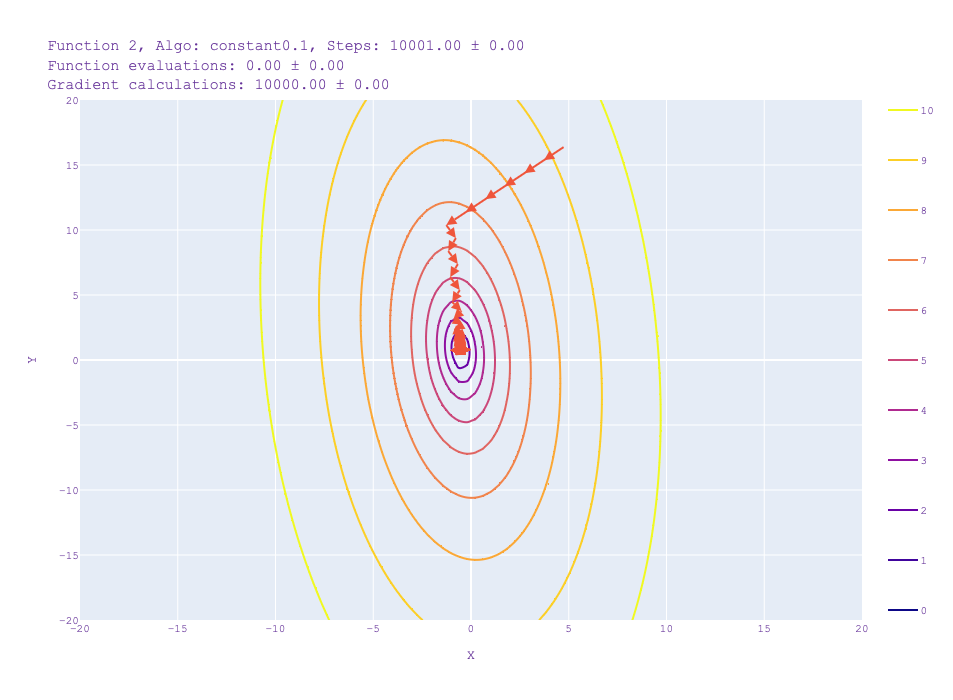

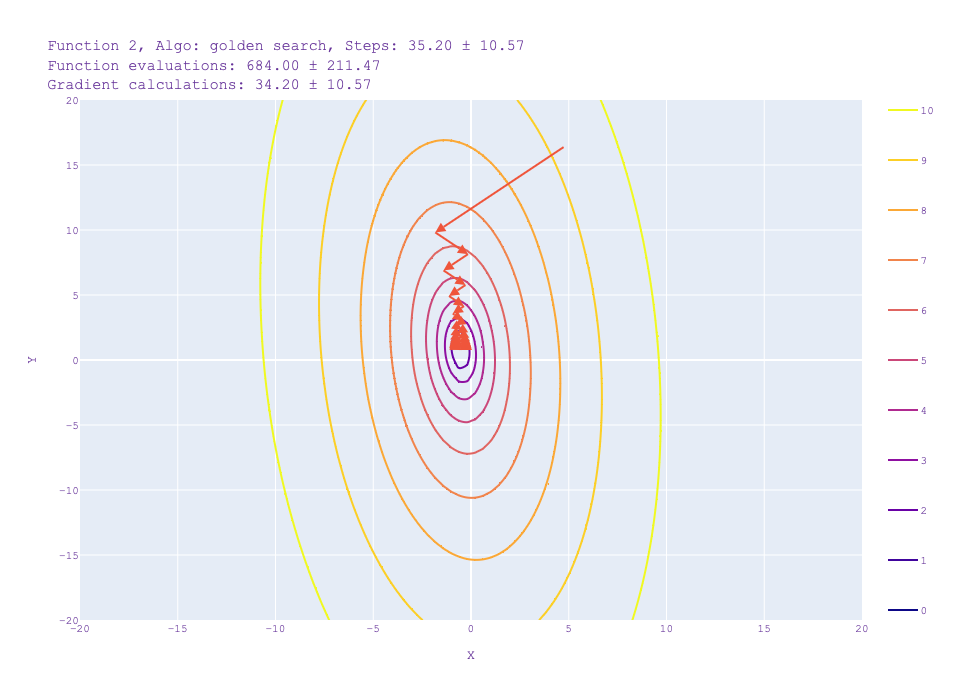

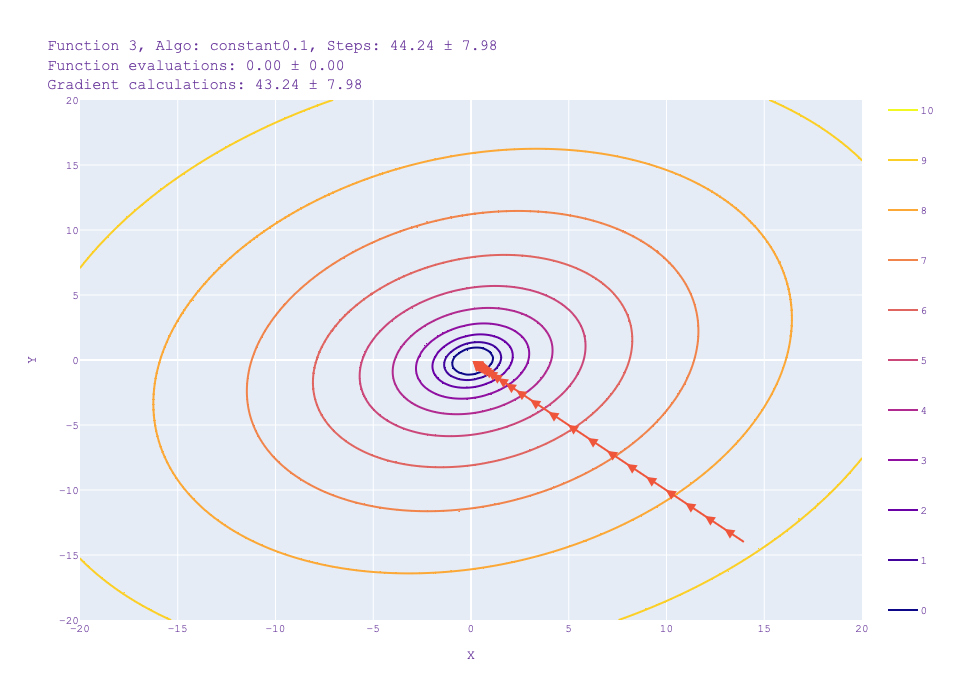

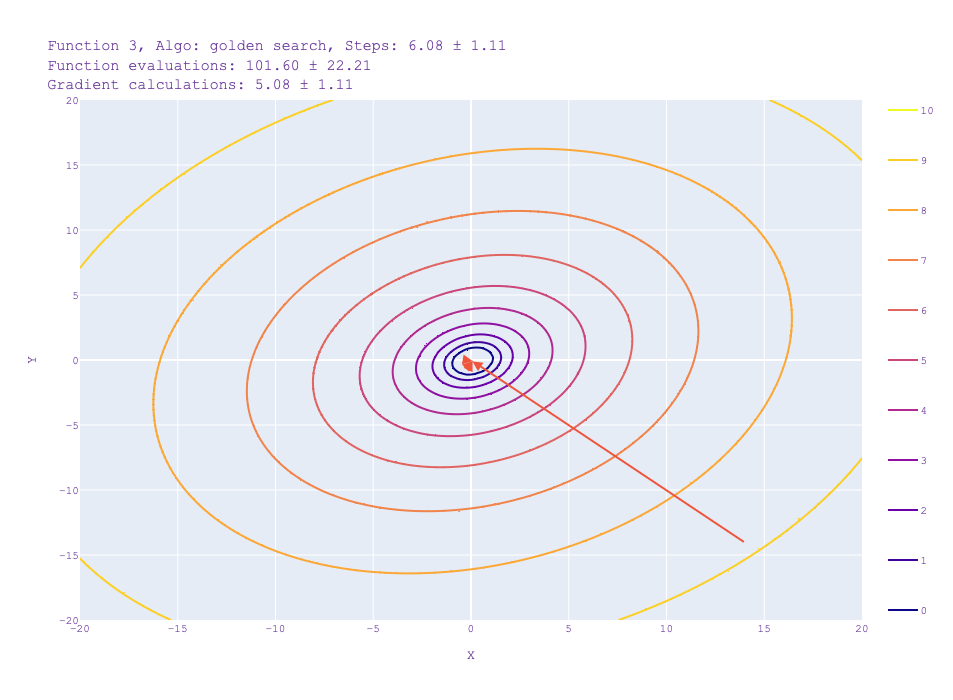

In [5]:
for f_id, f in enumerate(functions):
    for algo_name, algo in algos:
        metrics, fig = utils.run(f, f_id, algo, algo_name, ITERS)
        fig.show()

### Сходимость градиентного спуска с постоянным шагом alpha = 0.1

Будем считать, что алгоритм сошелся, если расстояние между старой и новой точкой меньше epsilon 

Для первой функции требуется в среднем __160__ итераций, для третьей – __44__. Но вторая функция не успевает сходиться за $10\,000$ итераций, так как она слабо обусловленна. Градиент по координате $X$ больше на несколько порядков чем по координате $Y$. Поэтому алгоритм "мечется" между двумя точками и константный шаг $\alpha$ не позволяет ему быстро выйти из этой зоны. Самый простой способ бороться с такой несходимостью это со временем уменьшать шаг $\alpha$. Например, после каждой итерации домножать $\alpha$ на $0.999$


У первой функции большая зона около точки (0;0) с маленьким значением градиента, что как раз сильно замедляет сходимость алгоритма

Также на всех успешных запусках мы видим $f(x_{k + 1}) < f(x_{k}), \lim_{x \to \infty} f'(x_k) \to 0$

### Сравнение константного шага и одномерной оптимизации

Для градиентного спуска с константным шагом не требуется вычисление функции. Однако это необходимо для одномерной оптимизации:

| Optimization |
| ------------- |
| 742 ± 340 |
| 684 ± 211  |
| 102 ± 22   |


Можно уменьшить количество вычислений следующим образом:

На каждом шаге мы минимизируем $\phi(\alpha) = f(x_{k} + \alpha \times d_{k}), \alpha > 0$

Заметим, что при $\alpha = \epsilon, \phi'(\alpha) < 0$, а при достаточно большом $\alpha$:  $\phi'(\alpha) > 0$, причем в нашем случае $\phi'(\alpha)$ возрастает. Тогда мы можем найти с помощью бинарного поиска найти $\phi'(\alpha) = 0$, что уменьшит количество итераций оптимизации в $\log_{\frac{1+\sqrt{5}}{2}}{2} \approx 1.44$.

Количество же вычислений градиентов (итераций алгоритма) в случае одномерной оптимизации уменьшается примерно в 6.4 раз:

| Constant       | Optimization |
| -------------- | ----------------- |
| 160 ± 32       | __38__ ± 17 |
| 10 000 ± 0     | __34__ ± 11   |
| 43 ± 8        |   __5__ ± 1.1 |

## Зависимость от начальной точки

Было запущено 50 градиентных спусков с различными начальными точками. Все они сошлись к минимуму вне зависимости от начального положения. Судя по таблице выше значения std составляет $\approx 30\%$ от среднего

### Scaling

Попробуем исправить алгоритм с константным шагом в случае слабо обусловленной функции. Для этого воспользуемся домножением каждой компоненты на константу. 

In [6]:
scale_algos = [
    (
        'constant0.1 scale', 
        algorithms.ConstantGradientDescent('random', alpha=0.1, random_scale=10, epsilon=EPS, use_scale=True)
    ),
    (
        'golden search scale', 
        algorithms.GoldenSearchGradientDescent('random', 5, EPS, random_scale=10, epsilon=EPS, use_scale=True)
    ),
]

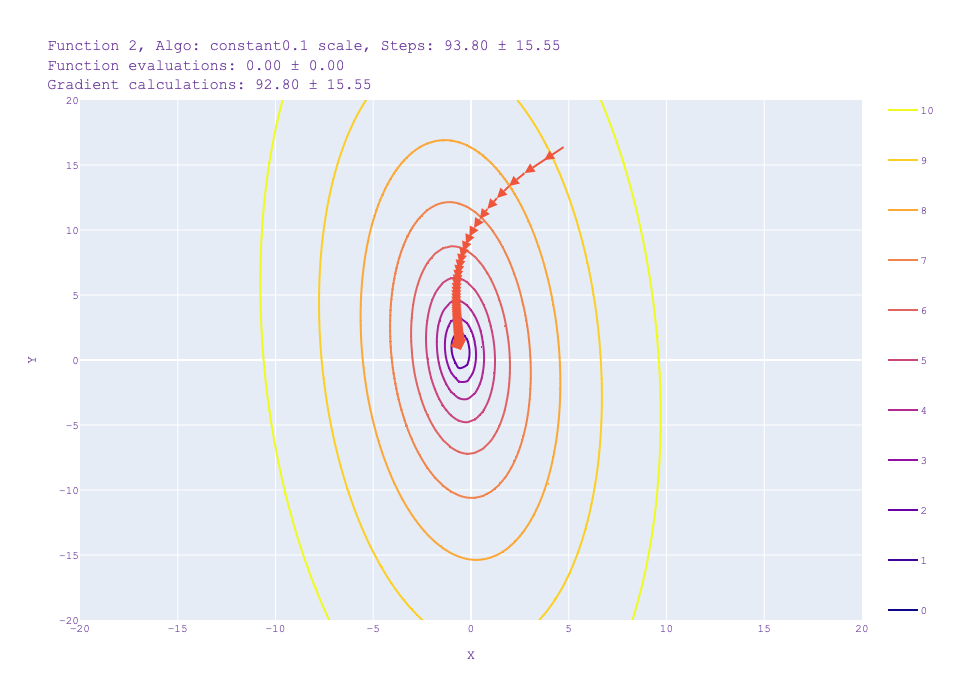

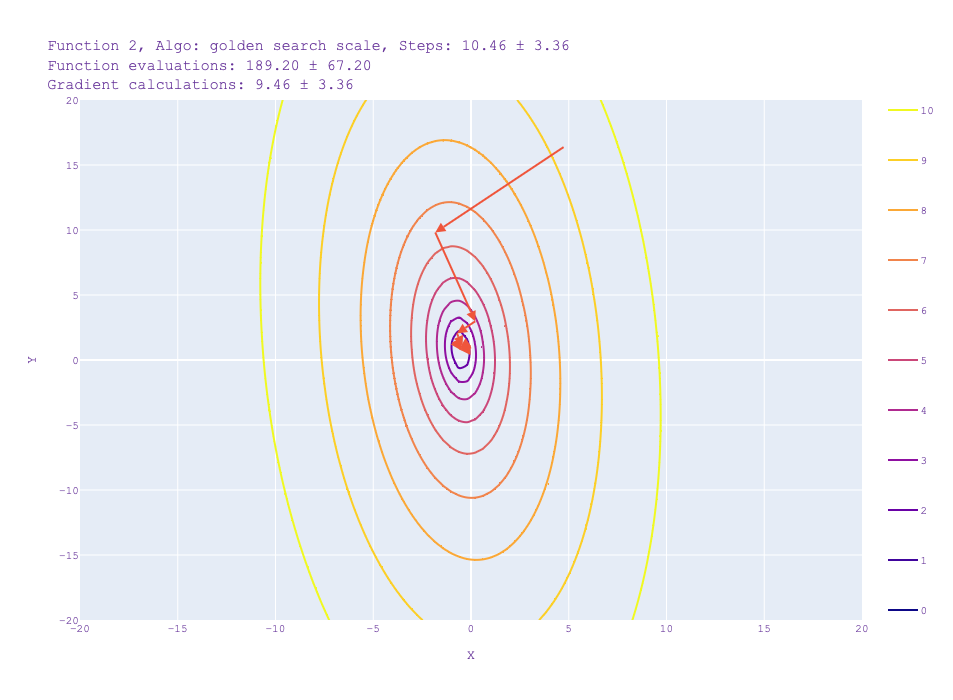

In [7]:
for scale_name, scale_algorithm in scale_algos:
    metrics, fig = utils.run(functions[1], 1, scale_algorithm, scale_name, ITERS)
    fig.show()

Видим, что алгоритм с константным шагом теперь сходится за 94 итерации в среднем. Также алгоритм с оптимизацией на каждом шагу сходится за количество итераций в среднем в 3 раза меньше.

## N-d functions

Посмотрим зависимость количества итераций $T(n, k)$ от размерности и числа обусловленности

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

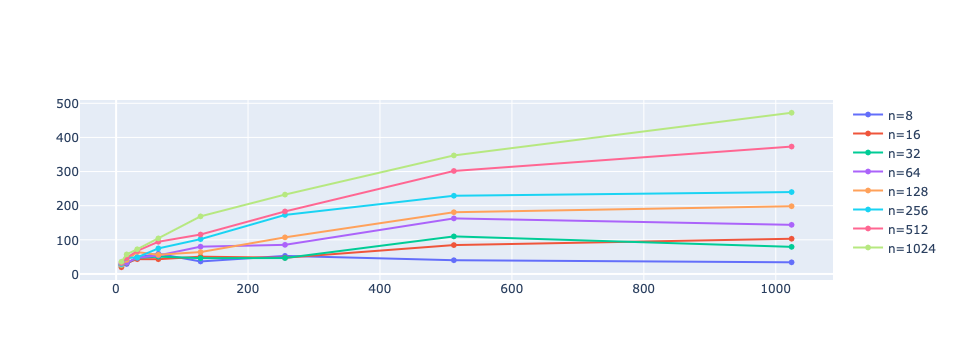

In [44]:
ns = [2 ** x for x in range(3, 11)]
ks = [2 ** x for x in range(3, 11)]

fig = go.Figure()
    
for n in tqdm(ns):
    iters = []
    for k in tqdm(ks, leave=False):    
        iter_sum = 0
        iter_cnt = 0
        for it in range(10):
            f = types.QuadraticFunction.generate_random(n, k)
            cur_algo = copy.deepcopy(algos[1][1])
            cur_algo.optimize(f)
            iter_sum += len(cur_algo.history_points)
            iter_cnt += 1
        iters.append(iter_sum / iter_cnt)
    fig.add_trace(go.Scatter(x=ks, y=iters, name=f'{n=}'))
    
fig.show()

По результатам эксперимента можно сделать следующие выводы:
1. Видим, что для разных значений $k$ Видим, что с ростом размерности $n$ число итераций $T(n, k)$ увеличивается незначительно, и, скорее, это влияние погрешности. В эксперименте для больших $n$ число итераций должно практически быть одинаковым
2. С увеличением числа обусловленности увеличивается количество итераций. На самом деле должна быть линейная зависимость, но на графике ее трудно заметить. Необходимо запустить больше экспериментов для различных значений $k$. 

## Выводы

1. Градиентный спуск с констатным шагом иногда может не сходиться из-за слишком большого значения $\alpha$. Чтобы автоматически это исправить, можно со временем уменьшать значения $\alpha$.
2. Градиентный спуск с одномерной оптимизацией требует в несколько раз меньше итераций. В свою очередь это уменьшает количество подсчета градиента функции, но увеличивает количество вычислений самой функции
3. Градиентный спуск сходится несмотря на начальное положение. Однако, слишком далекая начальная точка может увеличить необходимое количество итераций в несколько раз.
4. Scaling помогает в случае плохо обусловленных функций и уменьшает количество итераций в несколько раз.
5. Количество итераций растет линейно от числа обусловленности и остается неизменным от размерности функции

Для простых задач оптимизации, я бы выбрал алгоритм градиентного спуска с констатным шагом. Важно сразу подумать, необходимо ли добавить $scaling$. В случае проблем сходимости можно перебрать различные значения $\alpha$. Более универсальным решением будет динамическое изменение $\alpha$  на каждом шаге.